# Land Classification
*Created by Rohan Jagannathan, Anish Mankal, Srujan Mupparapu, Shruti Patel, Gautham Rajesh, and Pranav Venkatesh*

## Project Objective
The objective of this project is to classify and segment the geographic features of a land cover satellite image. Mask images will be produced by coloring the classified image segments with certain colors. The mask image will then serve as a map to show the locations of different geological features within a high-resolution satellite image.

## Applications in Energy
This is relevant to the energy industry as the classification task may help identify sub-sections of land that may contain optimal drilling sites for natural resources (oil, gas, etc) through satellite imagery. Example: A drilling company wanting to conduct natural gas extraction might need to identify a strategic location to drill to optimize their resource allocation. Classifying certain sub-sections of a satellite image might be useful in narrowing down the best sites, saving both time and money.

## Dataset
[link](https://www.kaggle.com/balraj98/deepglobe-land-cover-classification-dataset)

The dataset we’re planning on using contains 803 satellite and mask images that are 2448 x 2448 pixels. The satellite images have 50cm pixel resolutions and are collected by DigitalGlobe’s satellite. Additionally, the dataset contains 171 validation images and 172 test images that do not have corresponding mask images.

### Dataset Core Information
Predictive & Response Data
 * Predictive (raw): Satellite Images
 * Responsive (raw): 
    - Urban_land (Light Blue)
    - agriculture_land (Yellow)
    - rangeland (Pink)
    - forest_land (Green)
    - water (Blue)
    - barren_land (White)
    - unknown (Black)

**Size of Dataset**:  803 satellite images and 803 corresponding mask images

**Variable Type**: Discrete (RGB pixel values)

**Type of Information**: Image dataset (jpg) + color mappings (png)

## ML Methodology

### Image Preprocessing

In order to create a labelled dataset for classification, we will convert the provided mask image into labelled groups of pixels that correspond to the same pixels on the satellite image. The satellite image will be converted into a 3D matrix which represents the RGB values for each pixel.

### Model
We will use a Convolutional Neural Network to classify subsections of the input 3D matrix of pixels as a certain land feature. The network will be trained by computing the error in the produced classification versus the labelled classification (derived from the mask image). The model’s output will be a 2D matrix with the same length and width as the original image that stores numbers between 1 and 7, each denoting what type of land the model believes exists at each pixel of the original image.

### Postprocessed Output
Once we have produced the classification for each pixel on the satellite image, we will return an image with a translucent color overlay. There will be a color legend denoting what type of land corresponds to each color.


## Environment Setup

Select Runtime

In [37]:
SRUJAN = "srujan"
ROHAN = "rohan"
DRIVE = "drive"

using_local_runtime = False
using_department_machine = False
runtime = DRIVE

Free Up RAM Between Runs to Avoid Crashes

In [38]:
import gc
gc.collect()

27335

Connect to Google Drive

In [39]:
if runtime == DRIVE:
  from google.colab import drive
  drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


Imports

In [40]:
import numpy as np
import pandas as pd
import cv2 as cv
import pickle as pkl
import torch
import torch.nn as nn
from torchvision import transforms
from PIL import Image
from random import randint
import matplotlib.pyplot as plt
from torch.utils.data import DataLoader, Dataset
from os import closerange
from torch import tensor

print('imported')

imported


Settings

In [41]:
# choose correct root path based on runtime
base_path = '/content/drive/My Drive/FRI Data/'
if runtime == ROHAN:
    if using_department_machine:
        base_path = '/media/rohanj/FRI Data/'
    else:
        base_path = '/Volumes/FRI Data/'
elif runtime == SRUJAN:
    base_path = '/Users/srujanmupparapu/Desktop/Land Classification/'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# file paths
data_path = base_path + 'data/'
metadata_path = data_path + 'metadata.csv'
images_path = data_path + 'images/'
data_set_path = data_path + 'dataset.h5'
sat_file = data_path + 'transformed_sat'
mask_file = data_path + 'transformed_mask'
mask_mat_file = data_path + 'matrix_mask'
model_path = data_path + 'saved_model'
output_file = data_path + 'model_output'

# image details
num_images = 803
original_image_dimensions = 2448
class_names = ['urban_land', 'agriculture_land', 'rangeland', 'forest_land', 'water', 'barren_land', 'unknown']
class_colors = [[0, 255, 255], [255, 255, 0], [255, 0, 255], [0, 255, 0], [0, 0, 255], [255, 255, 255], [0, 0, 0]]
metadata = pd.read_csv(metadata_path)

# run configuration
run_data_preprocessing = True
run_data_initialization = True
run_data_analysis = True
tune_hyperparameters = True
run_model_training = True
run_model_testing = True

# data
transformed_sat = [] if 'transformed_sat' not in globals() else transformed_sat
transformed_mask = [] if 'transformed_mask' not in globals() else transformed_mask
mask_mats = [] if 'mask_mats' not in globals() else mask_mats

## Preprocess the Data

Display Sample Raw Satellite and Mask Images

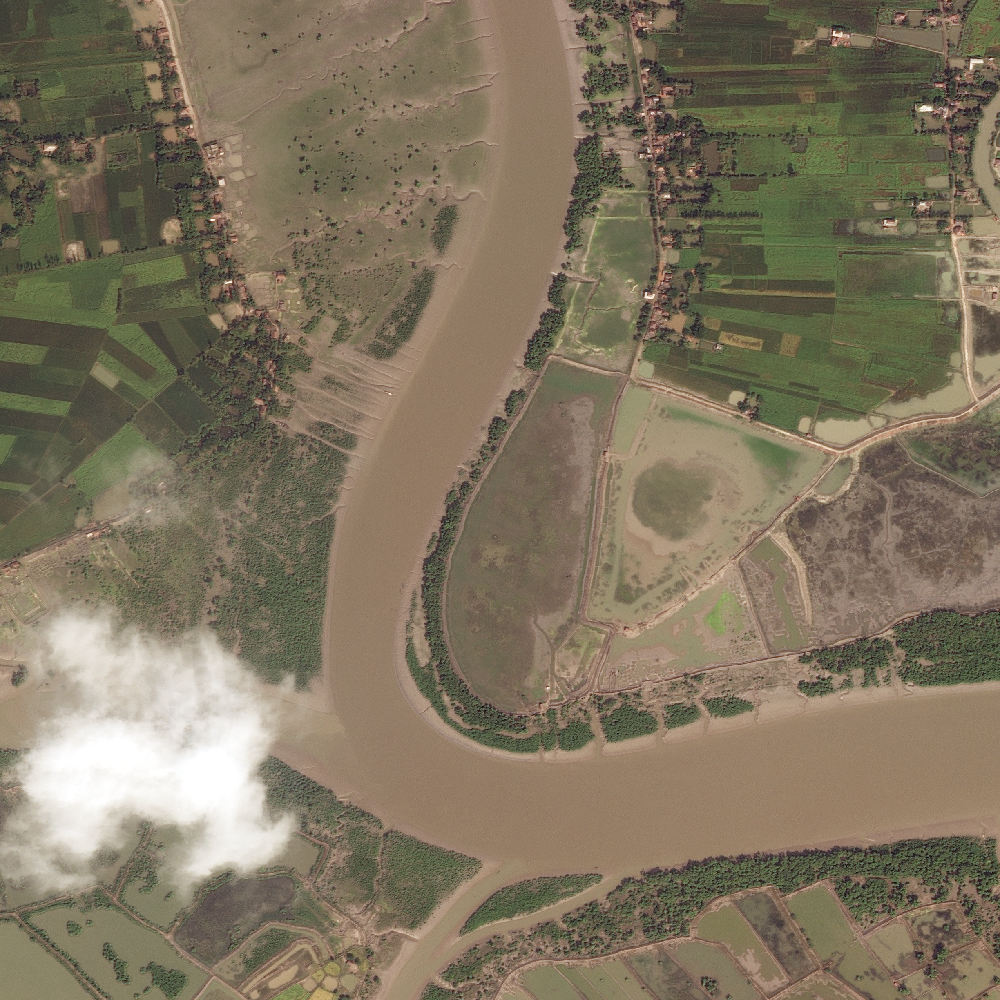

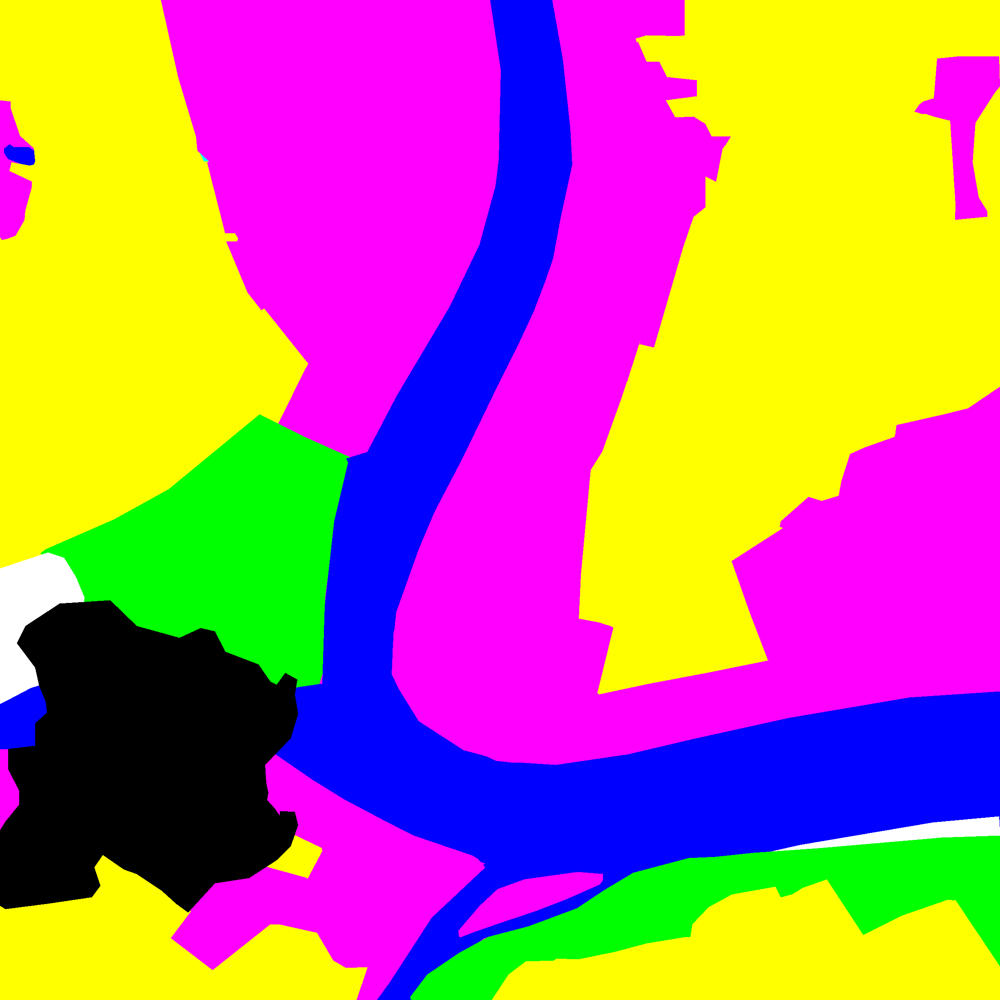

In [42]:
if run_data_preprocessing:
  example_sat_img = Image.open(images_path + "6399_sat.png")
  display(example_sat_img)
  example_mask_img = Image.open(images_path + "6399_mask.png")
  display(example_mask_img)


Define Image Transformations

In [43]:
scaled_dimensions = original_image_dimensions // 32
cropped_dimensions = scaled_dimensions - 12

img_transforms = transforms.Compose([
  transforms.Resize(scaled_dimensions, # scale from 2448 x 2448 to 76x76
  interpolation=transforms.InterpolationMode.NEAREST), # do not introduce new colors when downscaling
  transforms.CenterCrop(cropped_dimensions) # center crop to 64x64
])

print('defined')

defined


Process Satellite Images and Save to Pickle

In [44]:
def transform_sat_images():
  transformed_sat = []
  for i, img_set in enumerate(metadata['split']):
    # data in the given test and valid splits have no labels, so ignore them
    if img_set != 'train':
      continue
    
    # get PIL Images from each path
    path = metadata['sat_image_path'].iloc[i][6:-4] + '.png'
    img = Image.open(images_path + path)
    
    # convert them from RGBA to RGB, and do transforms defined above
    img = img.convert("RGB")
    img = img_transforms(img)

    transformed_sat.append(img)

    # display progress
    if i != 0 and i % 20 == 0:
      print('.', end='')
      if i % 100 == 0:
        print('|', end='')

  for i in range(0, len(transformed_sat)):
        transformed_sat[i] = np.array(transformed_sat[i], dtype='double')
        transformed_sat[i] = transformed_sat[i].transpose((2, 0, 1))
        transformed_sat[i] = transformed_sat[i] / 255
        transformed_sat[i] = transformed_sat[i].astype('double')

  # save images to pickle
  with open(sat_file, 'wb') as f:
       pkl.dump(transformed_sat, f)
       f.close()
       print('\ttransformed_sat pickled')

  return transformed_sat

print('defined')

defined


Process Mask Images and Save to Pickle

In [45]:
def transform_mask_images():
  transformed_mask = []
  for i, img_set in enumerate(metadata['split']):
    # no mask images in the given test and valid splits, so ignore them
    if img_set != 'train':
      continue
    
    # get PIL images from each path
    path = metadata['mask_path'].iloc[i][6:-4] + '.png'
    img = Image.open(images_path + path)

    # perform transforms defined above
    img = img_transforms(img)

    transformed_mask.append(img)

    # display progress
    if i != 0 and i % 20 == 0:
      print('.', end='')
      if i % 100 == 0:
        print('|', end='')

  # save images to pickle
  with open(mask_file, 'wb') as f:
    pkl.dump(transformed_mask, f)
    f.close()
    print('\ttransformed_mask pickled')

  
  return transformed_mask

print('defined')

defined


Process Mask/Label Images and Save Pickle

In [46]:
# get the land type classification based on the pixel color
def get_class(pixel):
  for i, color in enumerate(class_colors):
    if pixel == color:
      return i + 1
  return None

print('defined')

defined


In [47]:
# contstruct a matrix that contains the land type class for each pixel
def convert_mask_to_matrix(transformed_mask):
    mask_mats = []

    # create mask matrix from each transofrmed mask image
    for i, mask_image in enumerate(transformed_mask):
        mask_mat = []
        for x in range(0, cropped_dimensions):
          row = []
          for y in range(0, cropped_dimensions):
            row.append(get_class(list(mask_image.getpixel((x,y)))))
          mask_mat.append(row)
        mask_mats.append(mask_mat)

        # display progress
        if i != 0 and i % 20 == 0:
          print('.', end='')
          if i % 100 == 0:
            print('|', end='')

    print()

    # one-hot-encode matrices
    for i in range(0, len(mask_mats)):
        for r in range(0, cropped_dimensions):
            for c in range(0, cropped_dimensions):
                activations = np.zeros(7)
                activations[mask_mats[i][r][c] - 1] = 1
                mask_mats[i][r][c] = activations

        if i != 0 and i % 20 == 0:
            print('.', end='')
            if i % 100 == 0:
                print('|', end='')

    # save to pickle
    with open(mask_mat_file, 'wb') as f:
        pkl.dump(mask_mats, f)
        f.close()
        print('\tmask_mats pickled')


    return mask_mats

print('defined')

defined


Run Data Preprocessing

In [48]:
# run preprocessing and populate data containers
if run_data_preprocessing:
    transformed_sat = transform_sat_images()
    print()
    transformed_mask = transform_mask_images()
    print()
    mask_mats = convert_mask_to_matrix(transformed_mask)
    print()

print('done')

.....|.....|.....|.....|.....|.....|.....|.....|	transformed_sat pickled

.....|.....|.....|.....|.....|.....|.....|.....|	transformed_mask pickled

.....|.....|.....|.....|.....|.....|.....|.....|
.....|.....|.....|.....|.....|.....|.....|.....|	mask_mats pickled

done


## Initialize Data

Load Images from Pickle File

In [49]:
# populate data containers from saved state
if run_data_initialization:
  with open(sat_file, 'rb') as f:
    transformed_sat = pkl.load(f)
    f.close()

  with open(mask_file, 'rb') as f:
    transformed_mask = pkl.load(f)
    f.close()

  with open(mask_mat_file, 'rb') as f:
    mask_mats = pkl.load(f)
    f.close()

## Exploratory Data Analysis

Display the Land Type Distribution in a Bar Chart

In [50]:
def create_bar_chart(mask_matrices):
  values = [0] * 7
  names = ['1', '2', '3', '4', '5', '6', '7']
  colors = [(0, 1, 1), (1, 1, 0), (1, 0, 1), (0, 1, 0),
            (0, 0, 1), (0.9, 0.9, 0.9), (1, 1, 1)]

  for ctr, mask_mat in enumerate(mask_matrices):
    for i in range(0, len(mask_mat) - 1):
      for j in range(0, len(mask_mat[i]) - 1):
        val = np.argmax(mask_mat[i][j])
        if val != None:
          values[val] += 1
        else:
          values[6] += 1

  print('\nKEY: 1 = Urban Land, 2 = Agriculture Land, 3 = Rangeland, 4: Forest Land, 5: Water, 6: Barren Land, 7: Unknown')
  plt.bar(names, values, color=colors)
  plt.show()

print('defined')

defined


Display Sample of Transformed Data

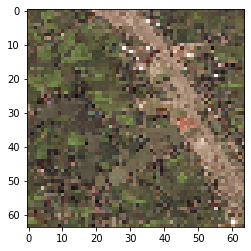

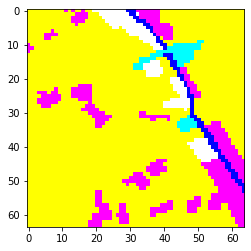


KEY: 1 = Urban Land, 2 = Agriculture Land, 3 = Rangeland, 4: Forest Land, 5: Water, 6: Barren Land, 7: Unknown


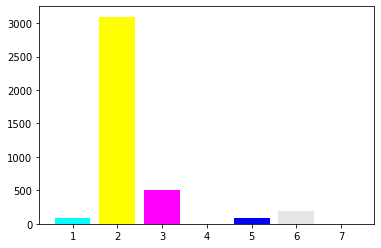

In [51]:
if run_data_analysis:
  # choose random image
  rand_index = randint(0, num_images - 1)
  img = transformed_sat[rand_index]

  plt.imshow(transformed_sat[rand_index].transpose(1, 2, 0))
  plt.show()
  plt.imshow(transformed_mask[rand_index])
  plt.show()
  mask_mat = mask_mats[rand_index]
  create_bar_chart([mask_mat])


Pixel Land Type Distribution For All Images

------------- Land Type Distribution Over All Images --------------

KEY: 1 = Urban Land, 2 = Agriculture Land, 3 = Rangeland, 4: Forest Land, 5: Water, 6: Barren Land, 7: Unknown


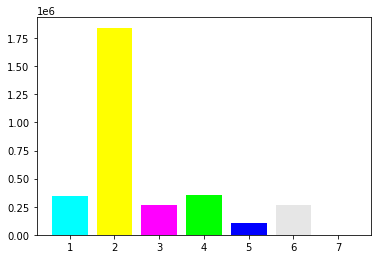

In [52]:
if run_data_analysis:
  print('------------- Land Type Distribution Over All Images --------------')
  create_bar_chart(mask_mats)

Based on the bar chart, agricultural land seems to make up most of our data by a large margin. This makes sense since it tends to take up an extremely large amount of space. There is also very little land classified as unknown.

## Model Development

Define Preprocess Image Data for Model

In [53]:
if run_data_initialization or run_data_preprocessing:
  # process satellite images for input
  for i in range(0, len(transformed_sat)):
    # convert PIL image to numpy
    transformed_sat[i] = np.array(transformed_sat[i], dtype='double')

Define Dataset Class

In [54]:
class LandDataset(Dataset):
    def __init__(self, inputs, outputs):
        self.features = inputs
        self.labels = outputs

    def __len__(self):
        return len(self.features)

    def __getitem__(self, idx):
        return self.features[idx], self.labels[idx]

### Create Dataloaders

In [55]:
b_size = 8

# 60-20-20 split (train-valid-test)
train_images = transformed_sat[:480]
valid_images = transformed_sat[480:640]
test_images = transformed_sat[640:]

train_images = torch.tensor(train_images)
valid_images = torch.tensor(valid_images)
test_images = torch.tensor(test_images)

train_images = train_images.to(device)
valid_images = valid_images.to(device)
test_images = test_images.to(device)

train_labels = torch.tensor(mask_mats[:480]).transpose(1, 2)
valid_labels = torch.tensor(mask_mats[480:640]).transpose(1, 2)
test_labels = torch.tensor(mask_mats[640:]).transpose(1, 2)

train_labels = torch.argmax(train_labels, dim=3)
valid_labels = torch.argmax(valid_labels, dim=3)
test_labels = torch.argmax(test_labels, dim=3)

train_labels = train_labels.to(device)
valid_labels = valid_labels.to(device)
test_labels = test_labels.to(device)

# Create datasets and dataloaders
train_data = LandDataset(train_images, train_labels)
valid_data = LandDataset(valid_images, valid_labels)
test_data = LandDataset(test_images, test_labels)

train_loader = DataLoader(train_data, batch_size=b_size, shuffle=True, num_workers=0)
valid_loader = DataLoader(valid_data, batch_size=b_size, shuffle=True, num_workers=0)
test_loader = DataLoader(test_data, batch_size=b_size, shuffle=False, num_workers=0)

print('created DataLoaders')

created DataLoaders


### Create Model

DISCLAIMER: This UNet architecture was sourced from https://github.com/milesial/Pytorch-UNet and modified to better suit our specific problem and dataset

In [56]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True, dropout_prob=0.2):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

        self.dropout = nn.Dropout(dropout_prob)

    def forward(self, x):
        x1 = self.inc(x)
        x1 = self.dropout(x1)
        x2 = self.down1(x1)
        x2 = self.dropout(x2)
        x3 = self.down2(x2)
        x3 = self.dropout(x3)
        x4 = self.down3(x3)
        x4 = self.dropout(x4)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

In [57]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

        self.conv_1 = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True)
        )
        self.conv_2 = nn.Sequential(
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv_1(x)
        return self.conv_2(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        # if bilinear, use the normal convolutions to reduce the number of channels
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels, in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

### Train Model

In [58]:
import torch.optim as optim
import mlflow

num_epochs = 35
criterion = nn.CrossEntropyLoss()
criterion = criterion.to(device)

# Store training metrics to create plots at the end of training
train_losses = []
valid_losses = []
valid_accuracies = []

# Calculates the average percentage of pixels that were correctly classified in a set of images
def calculate_accuracy(expected, actual):
    total_accuracy = 0
    for i, mat in enumerate(expected):
      confusion_matrix = expected[i] == actual[i]
      correct = 0
      total = len(confusion_matrix) * len(confusion_matrix[0])
      for row in confusion_matrix:
        for val in row:
          if val:
            correct += 1
      total_accuracy += 100 * (correct / total)
    return total_accuracy / len(expected)

def train_model(net, optimizer, epochs, print_progress=True):
    best_validation_loss = float('inf')
    for epoch in range(1, epochs + 1):
        # Reset loss for the current epoch
        train_loss = 0.0
        valid_loss = 0.0
        # Put model in training mode so weights get updated
        net.train()
        for i, (features, labels) in enumerate(train_loader, 1):
            # Zero out the optimizer gradients
            optimizer.zero_grad()
            # Get model output
            outputs = net(features)
            # Calculate loss and perform backpropogation
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            # Update Training Loss
            train_loss += (loss.item() - train_loss) / i

        # Switch model to evaluation mode to prevent weights from being updated during validation
        net.eval()
        expected = []
        actual = []
        for i, (features, labels) in enumerate(valid_loader, 1):
            # Get model outputs
            outputs = net(features)
            # Store outputs and labels to calculate accuracy
            for output in outputs:
              actual.append(torch.argmax(output, dim=0))
            for label in labels:
              expected.append(label)
            # Calculate loss
            loss = criterion(outputs, labels)
            valid_loss += (loss.item() - valid_loss) / i

        # Print training statistics for the current epoch
        if print_progress:
          accuracy = calculate_accuracy(expected, actual)
          print(f'\nEpoch: {epoch}\tTraining Loss: {train_loss}\n\t\tValidation Loss: {valid_loss}\n\t\tValidation Accuracy: {accuracy}%')
          valid_accuracies.append(accuracy)

        # Save loss metrics for plotting and/or hyperparameter optimization
        train_losses.append(train_loss)
        valid_losses.append(valid_loss)
        mlflow.log_metric('train_losses', train_loss, step=epoch)
        mlflow.log_metric('valid_losses', valid_loss, step=epoch)
        if valid_loss < best_validation_loss:
          best_validation_loss = valid_loss

    if print_progress:   
      print('\nFinished Training\n')
      
    return best_validation_loss

Hyperparameter Tuning

In [59]:
import optuna

# Suggests hyperparameters for the current trial
def get_hyperparameters(trial):
  learning_rate = trial.suggest_float('lr', 0.0001, 0.0004, log=True)
  momentum = trial.suggest_float('momentum', 0.4, 1.2, log=True)
  dropout_prob = trial.suggest_float('dropout', 0.1, 0.4, log=True)
  optimizer_type = trial.suggest_categorical('optimizer_type', ['Adam', 'SGD'])
  print(f'Hyperparameters: {trial.params}')
  return learning_rate, momentum, dropout_prob, optimizer_type

# Use suggested hyperparameters to train model
def objective(trial):
  with mlflow.start_run():
    learning_rate, momentum, dropout_prob, optimizer_type = get_hyperparameters(trial)
    mlflow.log_params(trial.params)
    mlflow.log_param('device', device)
    net = UNet(n_channels=3, n_classes=7, dropout_prob=dropout_prob).double().to(device)

    if optimizer_type == 'SGD':
      optimizer = optim.SGD(net.parameters(), lr=learning_rate, momentum=momentum)
    elif optimizer_type == 'Adam':
      optimizer = optim.Adam(net.parameters(), lr=learning_rate)
    
    best_valid_loss = train_model(net, optimizer, num_epochs, print_progress=False)
    return best_valid_loss

# Run multiple trials to find the best hyperparameters and print results
def optimize():
  study = optuna.create_study(study_name='land-classification-optuna', direction='minimize')
  study.optimize(objective, n_trials=10)
  print('Statistics:')
  print(f'\tNumber of finished trials: {len(study.trials)}')
  print('Best Trial:')
  best_trial = study.best_trial
  print(f'\tTrial Number: {best_trial.number}')
  print(f'\tLoss: {best_trial.value}')
  print('\tParameters: ')
  for key, value in best_trial.params.items():
    print(f'\t\t{key}: {value}')

In [60]:
if tune_hyperparameters:
  mlflow.end_run()
  optimize()

[I 2021-12-03 23:08:19,058] A new study created in memory with name: land-classification-optuna


Hyperparameters: {'lr': 0.000191257244903437, 'momentum': 1.1138470255349489, 'dropout': 0.3000677557117876, 'optimizer_type': 'Adam'}


[I 2021-12-03 23:12:33,367] Trial 0 finished with value: 0.7315476144848493 and parameters: {'lr': 0.000191257244903437, 'momentum': 1.1138470255349489, 'dropout': 0.3000677557117876, 'optimizer_type': 'Adam'}. Best is trial 0 with value: 0.7315476144848493.


Hyperparameters: {'lr': 0.00022746280222990943, 'momentum': 0.40044042757792314, 'dropout': 0.17490657361704987, 'optimizer_type': 'Adam'}


[I 2021-12-03 23:16:46,939] Trial 1 finished with value: 0.6984961372207645 and parameters: {'lr': 0.00022746280222990943, 'momentum': 0.40044042757792314, 'dropout': 0.17490657361704987, 'optimizer_type': 'Adam'}. Best is trial 1 with value: 0.6984961372207645.


Hyperparameters: {'lr': 0.00016651303425511916, 'momentum': 1.1734519947539972, 'dropout': 0.1594580638595616, 'optimizer_type': 'Adam'}


[I 2021-12-03 23:21:00,477] Trial 2 finished with value: 0.6749018581569881 and parameters: {'lr': 0.00016651303425511916, 'momentum': 1.1734519947539972, 'dropout': 0.1594580638595616, 'optimizer_type': 'Adam'}. Best is trial 2 with value: 0.6749018581569881.


Hyperparameters: {'lr': 0.0002699270745084648, 'momentum': 0.8969851990288451, 'dropout': 0.17237349823621928, 'optimizer_type': 'SGD'}


[I 2021-12-03 23:25:05,322] Trial 3 finished with value: 1.1788423113192408 and parameters: {'lr': 0.0002699270745084648, 'momentum': 0.8969851990288451, 'dropout': 0.17237349823621928, 'optimizer_type': 'SGD'}. Best is trial 2 with value: 0.6749018581569881.


Hyperparameters: {'lr': 0.0002694210808892537, 'momentum': 0.8938562679034232, 'dropout': 0.2522827317123602, 'optimizer_type': 'SGD'}


[I 2021-12-03 23:29:10,089] Trial 4 finished with value: 1.1184066987982884 and parameters: {'lr': 0.0002694210808892537, 'momentum': 0.8938562679034232, 'dropout': 0.2522827317123602, 'optimizer_type': 'SGD'}. Best is trial 2 with value: 0.6749018581569881.


Hyperparameters: {'lr': 0.00028893562823477354, 'momentum': 0.7129460372576636, 'dropout': 0.3659853844911554, 'optimizer_type': 'SGD'}


[I 2021-12-03 23:33:14,881] Trial 5 finished with value: 1.1144061025452552 and parameters: {'lr': 0.00028893562823477354, 'momentum': 0.7129460372576636, 'dropout': 0.3659853844911554, 'optimizer_type': 'SGD'}. Best is trial 2 with value: 0.6749018581569881.


Hyperparameters: {'lr': 0.00029945862045679294, 'momentum': 0.4408832029016432, 'dropout': 0.11415333429105883, 'optimizer_type': 'Adam'}


[I 2021-12-03 23:37:28,423] Trial 6 finished with value: 0.7019690309079697 and parameters: {'lr': 0.00029945862045679294, 'momentum': 0.4408832029016432, 'dropout': 0.11415333429105883, 'optimizer_type': 'Adam'}. Best is trial 2 with value: 0.6749018581569881.


Hyperparameters: {'lr': 0.0001555338561225817, 'momentum': 0.5887311392447679, 'dropout': 0.18229861236635114, 'optimizer_type': 'SGD'}


[I 2021-12-03 23:41:33,232] Trial 7 finished with value: 1.2089794193114638 and parameters: {'lr': 0.0001555338561225817, 'momentum': 0.5887311392447679, 'dropout': 0.18229861236635114, 'optimizer_type': 'SGD'}. Best is trial 2 with value: 0.6749018581569881.


Hyperparameters: {'lr': 0.0002225732161443134, 'momentum': 1.1760892874049393, 'dropout': 0.1530829691121322, 'optimizer_type': 'Adam'}


[I 2021-12-03 23:45:46,812] Trial 8 finished with value: 0.6764672320055849 and parameters: {'lr': 0.0002225732161443134, 'momentum': 1.1760892874049393, 'dropout': 0.1530829691121322, 'optimizer_type': 'Adam'}. Best is trial 2 with value: 0.6749018581569881.


Hyperparameters: {'lr': 0.0003890747914610239, 'momentum': 0.5554207980233699, 'dropout': 0.2633930408962803, 'optimizer_type': 'Adam'}


[I 2021-12-03 23:50:00,443] Trial 9 finished with value: 0.745839614134591 and parameters: {'lr': 0.0003890747914610239, 'momentum': 0.5554207980233699, 'dropout': 0.2633930408962803, 'optimizer_type': 'Adam'}. Best is trial 2 with value: 0.6749018581569881.


Statistics:
	Number of finished trials: 10
Best Trial:
	Trial Number: 2
	Loss: 0.6749018581569881
	Parameters: 
		lr: 0.00016651303425511916
		momentum: 1.1734519947539972
		dropout: 0.1594580638595616
		optimizer_type: Adam


Training Loop

Training Model

Epoch: 1	Training Loss: 1.5372278137736572
		Validation Loss: 1.233805332736512
		Validation Accuracy: 63.62213134765625%

Epoch: 2	Training Loss: 1.2541690608145637
		Validation Loss: 1.2833512122170712
		Validation Accuracy: 58.25439453125%

Epoch: 3	Training Loss: 1.1588639865181694
		Validation Loss: 1.083454563773642
		Validation Accuracy: 64.51446533203125%

Epoch: 4	Training Loss: 1.0892687849167682
		Validation Loss: 1.0593997375293145
		Validation Accuracy: 69.07150268554688%

Epoch: 5	Training Loss: 1.0201758550284536
		Validation Loss: 0.9802150421492976
		Validation Accuracy: 67.16751098632812%

Epoch: 6	Training Loss: 1.0108703182970449
		Validation Loss: 0.9088364932943792
		Validation Accuracy: 71.6656494140625%

Epoch: 7	Training Loss: 0.9701527602590196
		Validation Loss: 0.9294999874552234
		Validation Accuracy: 70.9661865234375%

Epoch: 8	Training Loss: 0.943535682584929
		Validation Loss: 0.874265344318251
		Validation Accuracy: 70.82916259765625%

E

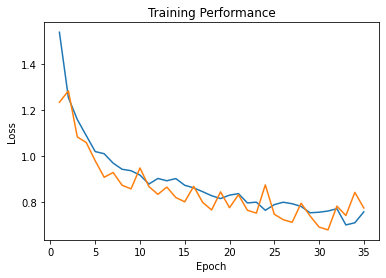

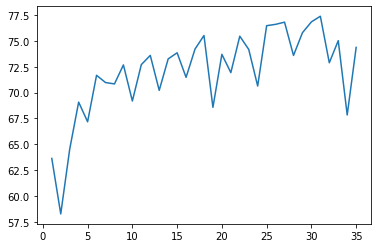

In [61]:
if run_model_training:
    print('Training Model')

    # Reset training metric storage containers for the current training loop
    train_losses = []
    valid_losses = []
    valid_accuracies = []

    # Define model and optimizer and run training loop
    net = UNet(n_channels=3, n_classes=7, dropout_prob=0.10288345699382447).double().to(device)
    optimizer = optim.Adam(net.parameters(), lr=0.00027028397096978316)
    train_model(net, optimizer, num_epochs)

    # Plot train/valid losses and validation accuracy
    x_axis = np.arange(1, num_epochs + 1)
    plt.plot(x_axis, np.asarray(train_losses), label='Training Loss')
    plt.plot(x_axis, np.asarray(valid_losses), label='Validation Loss')
    plt.title('Training Performance')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.show()
    plt.plot(x_axis, np.asarray(valid_accuracies), label='Validation Accuracy')
    plt.show()

    # Save model parameters
    torch.save(net.state_dict(), model_path)


if not run_model_training:
    # Load saved model
    net = UNet(n_channels=3, n_classes=7).double().to(device)
    net.load_state_dict(torch.load(model_path))

### Test Model

In [62]:
inputs = []
out = []

def test_model():
    test_loss = 0.0
    # Put model in evaluation mode to prevent weights from updating
    net.eval()
    expected = []
    actual = []
    for i, (features, labels) in enumerate(test_loader, 1):
        # Get model outputs and calculate loss
        inputs.append(features)
        outputs = net(features)

        # Save outputs for performance analysis and accuracy calculation
        out.append(outputs)
        for output in outputs:
          actual.append(torch.argmax(output, dim=0))
        for label in labels:
          expected.append(label)

        # Calculate loss
        loss = criterion(outputs, labels)
        test_loss += (loss.item() - test_loss) / i
    
    # Print Test Results
    test_accuracy = calculate_accuracy(expected, actual)
    print(f'Test Loss: {test_loss}\tTest Accuracy = {test_accuracy}%')

In [63]:
if run_model_testing:
    # Test model and save its output
    test_model()
    with open (output_file, 'wb') as f:
        pkl.dump(out, f)
        f.close()
        print('\nModel output saved')

else:
    # Load saved model output
    with open (output_file, "rb") as f:
        out = pkl.load(f)
        f.close()
        print('Model output loaded')

Test Loss: 0.746600478262754	Test Accuracy = 76.22040356595092%

Model output saved


## Results

In [64]:
# Process model output so it can be visualized
model_output = []
for row in out:
    for img in row:
        model_output.append(torch.argmax(img, dim=0))

output_images = []
for i, image in enumerate(model_output):
    img = []
    for j, row in enumerate(image):
        image_row = []
        for k, pixel in enumerate(row):
            image_row.append(class_colors[model_output[i][j][k]])
        img.append(image_row)
    output_images.append(img)

output_images = np.array(output_images)


# Process model input so it can be visualized
model_input = []
for batch in inputs:
    for image in batch:
        model_input.append((np.transpose(np.array(image.cpu()), (1, 2, 0))))

model_input = np.array(model_input)


# Process model labels so they can be visualized
output_labels = []
for i, image in enumerate(test_labels):
    new_img = []
    for j, row in enumerate(image):
        new_row = []
        for k, pixel in enumerate(row):
            new_row.append(np.array(class_colors[test_labels[i][j][k]]))
        new_img.append(np.array(new_row))
    output_labels.append(np.array(new_img))

output_labels = np.array(output_labels)

In [65]:
def view_output():
  # Get the index of a random test image
  rand_index = randint(0, len(test_images))

  # Show the original satellite image that was fed into the model
  plt.title('Original Image')
  plt.imshow((test_images[rand_index]).cpu().transpose(0, 1).transpose(1, 2))
  plt.show()

  # Show the original satellite image with the model's prediction overlayed on
  # top of it
  plt.title('Model Prediction')
  plt.imshow((test_images[rand_index]).cpu().transpose(0, 1).transpose(1, 2))
  plt.imshow((output_images[rand_index] / 255), alpha=0.25)
  plt.show()

  # Show the model's predicted mask
  plt.title('Predicted Mask')
  plt.imshow((output_images[rand_index] / 255))
  plt.show()

  # Show the actual mask for the satellite image
  plt.title('Expected Mask')
  plt.imshow(output_labels[rand_index] / 255)
  plt.show()



Sample Output 1



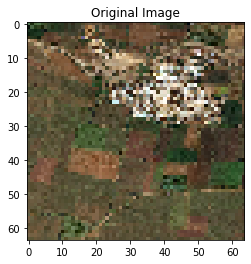

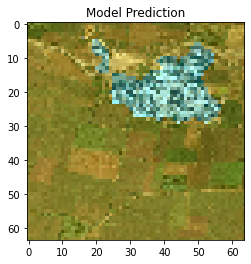

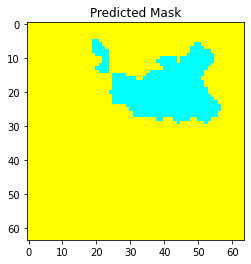

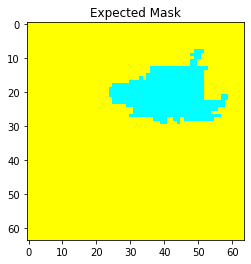



Sample Output 2



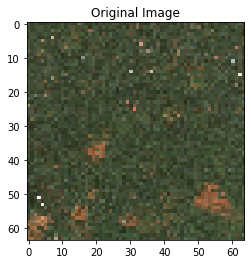

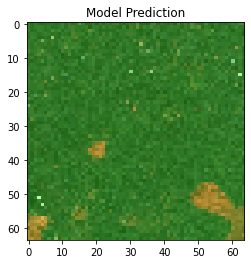

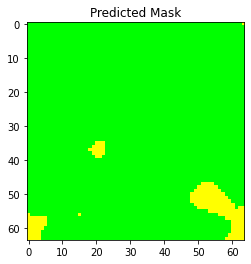

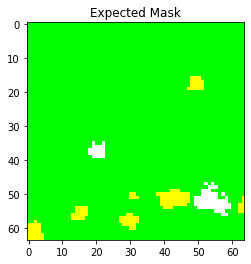



Sample Output 3



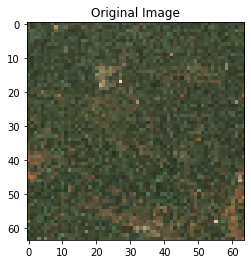

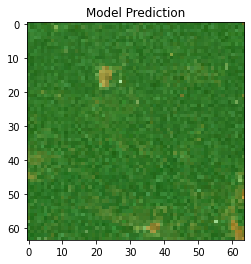

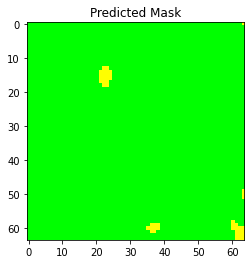

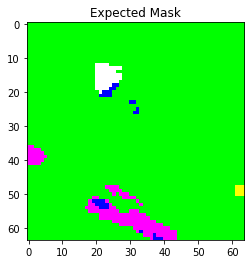



Sample Output 4



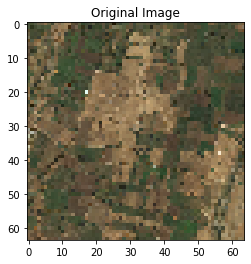

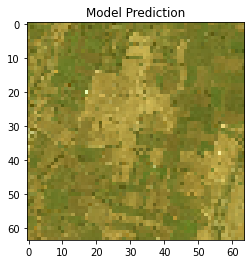

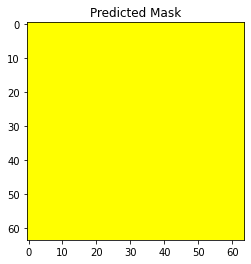

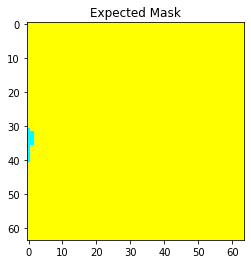

In [72]:
# Display 4 random test images and the model's results
for i in range(1, 5):
  print(f'\n\nSample Output {i}\n')
  view_output()